# **Movie Recommendation**<B>
![](data/title_image.png)<B>
* A market basket contains a group of products or services customers purchase frequently<b> 
* This reserch will create a movie recommendation system using the Apriori algorithm<b>

<h2 id="Top"><b>Top</b></h2>
<li><a href="#Import-modules">Import modules</a></li>
<li><a href="#Load-data">Load data</a></li>
<li><a href="#Basic-statistics">Basic statistics</a></li>
<li><a href="#Data-Cleanup">Data Cleanup</a></li>
<li><a href="#Exploratory-Data-Analysis">Exploratory Data Analysis</a></li>
<li><a href="#Feature-Engineering">Feature Engineering</a></li>
<li><a href="#Data-preprocessing">Data preprocessing</a></li>
<li><a href="#Finalize-Dataset">Finalize Dataset</a></li>
<li><a href="#Feature-Selection-Using-RFE-(Recursive-Feature-Elimination)">Feature Selection Using RFE (Recursive Feature Elimination)</a></li>
<li><a href="#Market-Basket-Creation">Market Basket Creation</a></li>
<li><a href="#Apriori-Association-Rule-Creation">Apriori Association Rule Creation</a></li>
<li><a href="#Conclusion">Conclusion</a></li>

<h2 id="Import-modules"><b>Import Modules</b></h2>
<a href="#Top"><h5>Top</h5></a>

In [1]:
#### Import the libraries needed
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns
from datetime import datetime
import re
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

from mlxtend.frequent_patterns import apriori,association_rules
from collections import Counter

In [2]:
# Set pd.options to add slide bars
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [3]:
# Set default title color
plt.style.use('fivethirtyeight')
plt.rcParams.update({'text.color': "#333333",
                     'axes.labelcolor': "#333333", 'axes.labelweight': 'bold'})

<h2 id="Load-data"><b>Load data</b></h2>
<a href="#Top"><h5>Top</h5></a>

In [4]:
# Load dataset
df_movies = pd.read_csv('data/movies.csv')
df_ratings_movies_cleaned = pd.read_csv('data/df_ratings_movies_cleaned.csv')

In [5]:
df_movies.head()

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [6]:
df_ratings_movies_cleaned.head()

,Unnamed: 0,userId,movieId,rating,year_month,genres_split,year,title_cleaned
0,0,1,1,4.0,2000-07,"Adventure, Animation, Children, Comedy, Fantasy",1995.0,Toy Story
1,1,1,3,4.0,2000-07,"Comedy, Romance",1995.0,Grumpier Old Men
2,2,1,6,4.0,2000-07,"Action, Crime, Thriller",1995.0,Heat
3,3,1,47,5.0,2000-07,"Mystery, Thriller",1995.0,Seven (a.k.a. Se7en)
4,4,1,50,5.0,2000-07,"Crime, Mystery, Thriller",1995.0,"Usual Suspects, The"


<h2 id="Market-Basket-Creation"><b>Market Basket Creation</b></h2>
<a href="#Top"><h5>Top</h5></a>

* A matrix called basket_encoded was created representing movies each user watched
* basket_encoded contains 610 users and 9724 movies
* 1 represents a movie that a user watched while 0 represents a movie that the same user didn't watch

In [7]:
# Create a basket grouping movies by 'userId' and 'movieId', and add 'rating'
basket = (df_ratings_movies_cleaned.groupby(['userId', 'movieId'])['rating'].sum().unstack().reset_index().fillna(0).set_index('userId'))

In [8]:
basket.shape

(610, 9724)

In [9]:
basket.head()

movieId    1    2    3    4    5    6    7    8    9   10   11   12   13   14  \
userId                                                                          
1        4.0  0.0  4.0  0.0  0.0  4.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
5        4.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

movieId   15   16   17   18   19   20   21   22   23   24   25   26   27   28  \
userId                                                                          
1        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4        0.0  0.0  0.0  0.0  0.0  0.0  3.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
5        0.0  0.0  0.0  0.0  0.0  0.0  4.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

movieId   29   30   31   32   34   36   38   39   40   41   42   43   44   45  \
userId                                                                          
1        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3        0.0  0.0  0.5  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4        0.0  0.0  0.0  2.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  3.0   
5        0.0  0.0  0.0  0.0  4.0  4.0  0.0  3.0  0.0  0.0  0.0  0.0  0.0  0.0   

movieId   46   47   48   49   50   52   53   54   55   57   58   60   61   62  \
userId                                                                          
1        0.0  5.0  0.0  0.0  5.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4        0.0  2.0  0.0  0.0  0.0  3.0  0.0  0.0  0.0  0.0  3.0  0.0  0.0  0.0   
5        0.0  0.0  0.0  0.0  4.0  0.0  0.0  0.0  0.0  0.0  5.0  0.0  0.0  0.0   

movieId   63   64   65   66   68   69   70   71   72   73   74   75   76   77  \
userId                                                                          
1        0.0  0.0  0.0  0.0  0.0  0.0  3.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
5        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

movieId   78   79   80   81   82   83   85   86   87   88   89   92   93   94  \
userId                                                                          
1        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
5        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

movieId   95   96   97   99  100  101  102  103  104  105  106  107  108  110  \
userId                                                                          
1        0.0  0.0  0.0  0.0  0.0  5.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  4.0   
2        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  4.0  0.0  0.0  0.0   
5        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  4.0   

movieId  111  112  113  

In [10]:
# Hot-encode bascket so that values represent 0 and 1
def encode_units(x):
    if x < 1:
        return 0
    if x >= 1:
        return 1

basket_encoded = basket.applymap(encode_units)

In [11]:
basket_encoded.head()

movieId  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  \
userId                                                                       
1        1  0  1  0  0  1  0  0  0   0   0   0   0   0   0   0   0   0   0   
2        0  0  0  0  0  0  0  0  0   0   0   0   0   0   0   0   0   0   0   
3        0  0  0  0  0  0  0  0  0   0   0   0   0   0   0   0   0   0   0   
4        0  0  0  0  0  0  0  0  0   0   0   0   0   0   0   0   0   0   0   
5        1  0  0  0  0  0  0  0  0   0   0   0   0   0   0   0   0   0   0   

movieId  20  21  22  23  24  25  26  27  28  29  30  31  32  34  36  38  39  \
userId                                                                        
1         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
2         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
3         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
4         0   1   0   0   0   0   0   0   0   0   0   0   1   0   0   0   0   
5         0   1   0   0   0   0   0   0   0   0   0   0   0   1   1   0   1   

movieId  40  41  42  43  44  45  46  47  48  49  50  52  53  54  55  57  58  \
userId                                                                        
1         0   0   0   0   0   0   0   1   0   0   1   0   0   0   0   0   0   
2         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
3         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
4         0   0   0   0   0   1   0   1   0   0   0   1   0   0   0   0   1   
5         0   0   0   0   0   0   0   0   0   0   1   0   0   0   0   0   1   

movieId  60  61  62  63  64  65  66  68  69  70  71  72  73  74  75  76  77  \
userId                                                                        
1         0   0   0   0   0   0   0   0   0   1   0   0   0   0   0   0   0   
2         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
3         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
4         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
5         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   

movieId  78  79  80  81  82  83  85  86  87  88  89  92  93  94  95  96  97  \
userId                                                                        
1         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
2         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
3         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
4         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
5         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   

movieId  99  100  101  102  103  104  105  106  107  108  110  111  112  113  \
userId                                                                         
1         0    0    1    0    0    0    0    0    0    0    1    0    0    0   
2         0    0    0    0    0    0    0    0    0    0    0    0    0    0   
3         0    0    0    0    0    0    0    0    0    0    0    0    0    0   
4         0    0    0    0    0    0    0    1    0    0    0    0    0    0   
5         0    0    0    0    0    0    0    0    0    0    1    0    0    0   

movieId  116  117  118  119  121  122  123  125  126  128  129  132  135  137  \
userId                                                                          
1          0    0    0    0    0    0    0    0    0    0    0    0    0    0   
2          0    0    0    0    0    0    0    0    0    0    0    0    0    0   
3          0    0    0    0    0    0    0    0    0    0    0    0    0    0   
4          0    0    0    0    0    0    0    1    1    0    0    0    0    0   
5          0    0    0    0    0    0    0    0    0    0    0    0    0    0   

movieId  140  141  144  145  146  147  148  149  150  151  152  153  154  155  \
userId                     

<h2 id="Apriori-Association-Rule-Creation"><b>Apriori Association Rule Creation</b></h2>
<a href="#Top"><h5>Top</h5></a>

* Two 'movieId', 21 amd 100 were randomly selected
* basket_encoded was filtered by 'userId' who watched 'movieId' 21 and 100 to create df_movieId_21 and df_movieId_100, respectively
* 

In [12]:
# Filter the data whose 'movieId' is 21
df_movieId_21 = basket_encoded.loc[basket_encoded[21] == 1]
df_movieId_21.head()

movieId  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  \
userId                                                                       
4        0  0  0  0  0  0  0  0  0   0   0   0   0   0   0   0   0   0   0   
5        1  0  0  0  0  0  0  0  0   0   0   0   0   0   0   0   0   0   0   
6        0  1  1  1  1  1  1  1  0   1   1   0   1   0   1   1   1   0   1   
8        0  1  0  0  0  0  0  0  0   1   1   0   0   0   0   0   0   0   0   
28       0  0  0  0  0  1  0  0  0   0   0   0   0   0   0   1   0   0   0   

movieId  20  21  22  23  24  25  26  27  28  29  30  31  32  34  36  38  39  \
userId                                                                        
4         0   1   0   0   0   0   0   0   0   0   0   0   1   0   0   0   0   
5         0   1   0   0   0   0   0   0   0   0   0   0   0   1   1   0   1   
6         0   1   1   0   1   1   1   1   0   0   0   1   1   1   1   0   0   
8         0   1   0   0   0   0   0   0   0   0   0   0   1   1   0   0   1   
28        0   1   0   1   0   0   0   0   0   0   0   1   1   0   0   0   0   

movieId  40  41  42  43  44  45  46  47  48  49  50  52  53  54  55  57  58  \
userId                                                                        
4         0   0   0   0   0   1   0   1   0   0   0   1   0   0   0   0   1   
5         0   0   0   0   0   0   0   0   0   0   1   0   0   0   0   0   1   
6         0   1   0   1   0   1   1   1   0   0   1   0   0   1   0   0   0   
8         0   0   0   0   0   0   0   1   0   0   1   0   0   0   0   0   0   
28        0   0   0   0   0   0   0   1   0   0   1   0   0   0   0   0   0   

movieId  60  61  62  63  64  65  66  68  69  70  71  72  73  74  75  76  77  \
userId                                                                        
4         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
5         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
6         1   1   1   0   0   1   1   0   0   0   0   0   0   0   0   1   0   
8         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
28        0   0   1   0   0   0   0   0   0   0   0   0   0   0   0   0   0   

movieId  78  79  80  81  82  83  85  86  87  88  89  92  93  94  95  96  97  \
userId                                                                        
4         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
5         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
6         0   1   0   0   0   0   0   1   1   1   1   1   1   0   1   0   0   
8         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
28        0   0   0   0   0   0   0   0   0   0   0   0   0   0   1   0   0   

movieId  99  100  101  102  103  104  105  106  107  108  110  111  112  113  \
userId                                                                         
4         0    0    0    0    0    0    0    1    0    0    0    0    0    0   
5         0    0    0    0    0    0    0    0    0    0    1    0    0    0   
6         0    1    0    1    0    1    1    0    0    0    1    0    1    1   
8         0    0    0    0    0    0    0    0    0    0    1    0    0    0   
28        0    0    0    0    0    0    0    0    0    0    1    0    0    0   

movieId  116  117  118  119  121  122  123  125  126  128  129  132  135  137  \
userId                                                                          
4          0    0    0    0    0    0    0    1    1    0    0    0    0    0   
5          0    0    0    0    0    0    0    0    0    0    0    0    0    0   
6          0    0    0    0    0    0    0    0    1    0    0    0    1    0   
8          0    0    0    0    0    0    0    0    0    0    0    0    0    0   
28         0    0    0    0    0    0    0    0    0    0    0    0    0    0   

movieId  140  141  144  145  146  147  148  149  150  151  152  153  154  155  \
userId                     

In [13]:
# Applying apriori algorithm for wooden_star_df
frequent_movies = apriori(df_movieId_21, min_support=0.35, use_colnames=True)

In [14]:
# Storing the association rules into rules
movieId_21_rules = association_rules(frequent_movies, metric="lift", min_threshold=1)

In [15]:
# Sorting the rules on lift and support
movieId_21_rules = movieId_21_rules.sort_values(['lift','support'],ascending=False).reset_index(drop=True)

In [16]:
movieId_21_rules.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,"(296, 2571)",(1580),0.382022,0.415730,0.370787,0.970588,2.334658,0.211968,19.865169
1,(1580),"(296, 2571)",0.415730,0.382022,0.370787,0.891892,2.334658,0.211968,5.716292
2,"(296, 2571, 21)",(1580),0.382022,0.415730,0.370787,0.970588,2.334658,0.211968,19.865169
3,"(296, 2571)","(1580, 21)",0.382022,0.415730,0.370787,0.970588,2.334658,0.211968,19.865169
4,"(1580, 21)","(296, 2571)",0.415730,0.382022,0.370787,0.891892,2.334658,0.211968,5.716292


In [21]:
# Extract top 6 unique consequents 
t = pd.Series(movieId_21_rules['consequents'].unique()[:6])

# Convert a frozenset object to a list
consequents_21 = t.apply(lambda x: list(x))
consequents_21

0             [1580]
1        [296, 2571]
2         [1580, 21]
3    [296, 2571, 21]
4        [457, 1196]
5        [1240, 260]
dtype: object

In [18]:
t = pd.Series(movieId_21_rules['antecedents'][:6])
antecedents_21 = t.apply(lambda x:list(x))
antecedents_21

0        [296, 2571]
1             [1580]
2    [296, 2571, 21]
3        [296, 2571]
4         [1580, 21]
5             [1580]
Name: antecedents, dtype: object

In [19]:
title = df_movies['title'][df_movies['movieId'] == 21].values
title = title[0]
print(f'{df_movieId_21.shape[0]} users watched the movie ID 21, "{title}"')

89 users watched the movie ID 21, "Get Shorty (1995)"


In [22]:
# Print movie titles in top 6 consequents
consequent_movies = []
for i in range(len(consequents_21)):
  print(f'\nConsequents: {i+1}')
  for j in range(len(consequents_21[i])):
    title = df_movies['title'][df_movies['movieId'] == consequents_21[i][j]].values
    print(f'{title[0]}')


Consequents: 1
Men in Black (a.k.a. MIB) (1997)

Consequents: 2
Pulp Fiction (1994)
Matrix, The (1999)

Consequents: 3
Men in Black (a.k.a. MIB) (1997)
Get Shorty (1995)

Consequents: 4
Pulp Fiction (1994)
Matrix, The (1999)
Get Shorty (1995)

Consequents: 5
Fugitive, The (1993)
Star Wars: Episode V - The Empire Strikes Back (1980)

Consequents: 6
Terminator, The (1984)
Star Wars: Episode IV - A New Hope (1977)


In [23]:
# Filter the data whose 'movieId' is 100
df_movieId_150 = basket_encoded[basket_encoded[150] == 1]
df_movieId_150.head()

movieId  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  \
userId                                                                       
5        1  0  0  0  0  0  0  0  0   0   0   0   0   0   0   0   0   0   0   
6        0  1  1  1  1  1  1  1  0   1   1   0   1   0   1   1   1   0   1   
7        1  0  0  0  0  0  0  0  0   0   0   0   0   0   0   0   0   0   0   
8        0  1  0  0  0  0  0  0  0   1   1   0   0   0   0   0   0   0   0   
11       0  0  0  0  0  1  0  0  0   1   0   0   0   0   0   0   0   0   0   

movieId  20  21  22  23  24  25  26  27  28  29  30  31  32  34  36  38  39  \
userId                                                                        
5         0   1   0   0   0   0   0   0   0   0   0   0   0   1   1   0   1   
6         0   1   1   0   1   1   1   1   0   0   0   1   1   1   1   0   0   
7         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
8         0   1   0   0   0   0   0   0   0   0   0   0   1   1   0   0   1   
11        0   0   0   0   0   0   0   0   0   0   0   0   0   0   1   0   0   

movieId  40  41  42  43  44  45  46  47  48  49  50  52  53  54  55  57  58  \
userId                                                                        
5         0   0   0   0   0   0   0   0   0   0   1   0   0   0   0   0   1   
6         0   1   0   1   0   1   1   1   0   0   1   0   0   1   0   0   0   
7         0   0   0   0   0   0   0   0   0   0   1   0   0   0   0   0   1   
8         0   0   0   0   0   0   0   1   0   0   1   0   0   0   0   0   0   
11        0   0   0   0   1   0   0   0   0   0   0   0   0   0   0   0   0   

movieId  60  61  62  63  64  65  66  68  69  70  71  72  73  74  75  76  77  \
userId                                                                        
5         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
6         1   1   1   0   0   1   1   0   0   0   0   0   0   0   0   1   0   
7         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
8         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
11        0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   

movieId  78  79  80  81  82  83  85  86  87  88  89  92  93  94  95  96  97  \
userId                                                                        
5         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
6         0   1   0   0   0   0   0   1   1   1   1   1   1   0   1   0   0   
7         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
8         0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
11        0   0   0   0   0   0   0   0   0   0   0   0   0   0   1   0   0   

movieId  99  100  101  102  103  104  105  106  107  108  110  111  112  113  \
userId                                                                         
5         0    0    0    0    0    0    0    0    0    0    1    0    0    0   
6         0    1    0    1    0    1    1    0    0    0    1    0    1    1   
7         0    0    0    0    0    0    0    0    0    0    0    0    0    0   
8         0    0    0    0    0    0    0    0    0    0    1    0    0    0   
11        0    0    0    0    0    0    0    0    0    0    1    0    0    0   

movieId  116  117  118  119  121  122  123  125  126  128  129  132  135  137  \
userId                                                                          
5          0    0    0    0    0    0    0    0    0    0    0    0    0    0   
6          0    0    0    0    0    0    0    0    1    0    0    0    1    0   
7          0    0    0    0    0    0    0    0    0    0    0    0    0    0   
8          0    0    0    0    0    0    0    0    0    0    0    0    0    0   
11         0    0    0    0    0    0    0    0    0    0    0    0    0    0   

movieId  140  141  144  145  146  147  148  149  150  151  152  153  154  155  \
userId                     

In [25]:
df_movieId_150.shape

(201, 9724)

In [26]:
# Applying apriori algorithm for wooden_star_df
frequent_movies_150 = apriori(df_movieId_150, min_support=0.35, use_colnames=True)

In [27]:
# Storing the association rules into rules
movieId_150_rules = association_rules(frequent_movies_150, metric="lift", min_threshold=1)

In [28]:
# Sorting the rules on lift and support
movieId_150_rules = movieId_150_rules.sort_values(['lift','support'],ascending=False).reset_index(drop=True)

In [29]:
# Extract top 6 unique consequents 
t = pd.Series(movieId_150_rules['consequents'].unique()[:6])

# Convert a frozenset object to a list
consequents_150 = t.apply(lambda x: list(x))
consequents_150

0              [1196]
1         [1210, 260]
2         [1196, 150]
3    [1210, 260, 150]
4              [1210]
5         [1196, 260]
dtype: object

In [30]:
title = df_movies['title'][df_movies['movieId'] == 150].values
title = title[0]
print(f'{df_movieId_150.shape[0]} users watched the movie ID 150, "{title}"')

201 users watched the movie ID 150, "Apollo 13 (1995)"


In [31]:
# Print movie titles in top 6 consequents
consequent_movies = []
for i in range(len(consequents_150)):
  print(f'\nConsequents: {i+1}')
  for j in range(len(consequents_150[i])):
    title = df_movies['title'][df_movies['movieId'] == consequents_150[i][j]].values
    print(f'{title[0]}')


Consequents: 1
Star Wars: Episode V - The Empire Strikes Back (1980)

Consequents: 2
Star Wars: Episode VI - Return of the Jedi (1983)
Star Wars: Episode IV - A New Hope (1977)

Consequents: 3
Star Wars: Episode V - The Empire Strikes Back (1980)
Apollo 13 (1995)

Consequents: 4
Star Wars: Episode VI - Return of the Jedi (1983)
Star Wars: Episode IV - A New Hope (1977)
Apollo 13 (1995)

Consequents: 5
Star Wars: Episode VI - Return of the Jedi (1983)

Consequents: 6
Star Wars: Episode V - The Empire Strikes Back (1980)
Star Wars: Episode IV - A New Hope (1977)


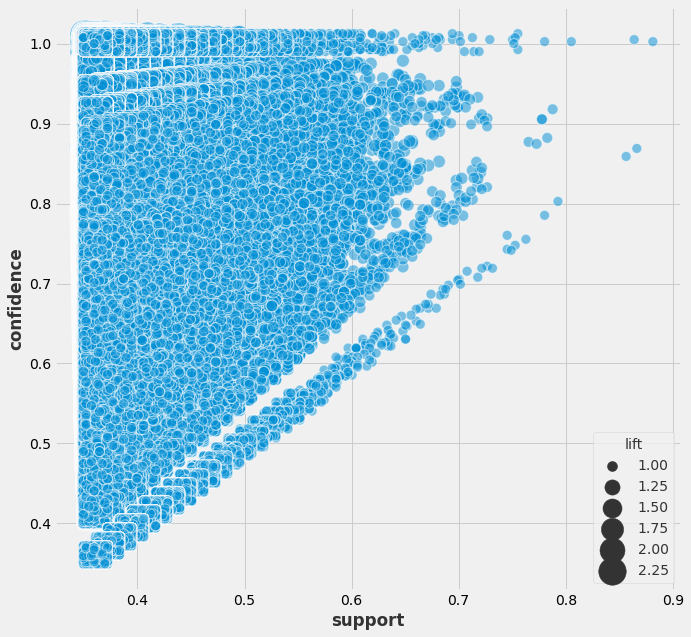

In [29]:
import random

for i in range(len(movieId_21_rules['support'])):
    movieId_21_rules['support'][i] = movieId_21_rules['support'][i] + 0.0025 * (random.randint(1,10) - 5)
    movieId_21_rules['confidence'][i] = movieId_21_rules['confidence'][i] + 0.0025 * (random.randint(1,10) - 5)
plt.subplots(figsize=(10, 10))
sns.scatterplot(x='support', y='confidence', size = "lift", sizes=(100, 800), data=movieId_21_rules, alpha=0.5);

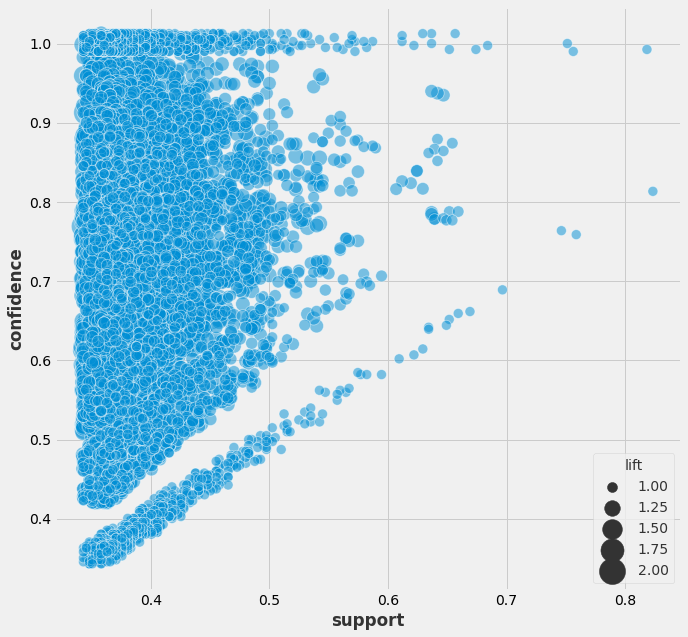

In [30]:
for i in range(len(movieId_150_rules['support'])):
    movieId_150_rules['support'][i] = movieId_150_rules['support'][i] + 0.0025 * (random.randint(1,10) - 5)
    movieId_150_rules['confidence'][i] = movieId_150_rules['confidence'][i] + 0.0025 * (random.randint(1,10) - 5)
plt.subplots(figsize=(10, 10))
sns.scatterplot(x='support', y='confidence', size = "lift", sizes=(100, 800), data=movieId_150_rules, alpha=0.5);

In [32]:
import networkx as nx

In [33]:
def graph(rules, no_of_rules):
  G1 = nx.DiGraph()
   
  color_map=[]
  N = 50
  colors = np.random.rand(N)    
  strs=['R0', 'R1', 'R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8', 'R9', 'R10', 'R11']   
   
   
  for i in range (no_of_rules):      
    
    # adding as many nodes as number of rules requested by user
    G1.add_nodes_from(["R"+str(i)])
    
    # adding antecedents to the nodes 
    for a in rules.iloc[i]['antecedents']:
                
        G1.add_nodes_from([a])
        
        G1.add_edge(a, "R"+str(i), color=colors[i] , weight = 2)
    
    # adding consequents to the nodes
    for c in rules.iloc[i]['consequents']:
             
            G1.add_nodes_from([c])
            
            G1.add_edge("R"+str(i), c, color=colors[i],  weight=2)
 
  for node in G1:
       found_a_string = False
       for item in strs: 
           if node==item:
                found_a_string = True
       if found_a_string:
            color_map.append('yellow')
       else:
            color_map.append('green')       
 
  edges = G1.edges()
  colors = [G1[u][v]['color'] for u,v in edges]
  weights = [G1[u][v]['weight'] for u,v in edges]
 
  pos = nx.spring_layout(G1, k=16, scale=1)
  nx.draw(G1, pos, node_color = color_map, edge_color=colors, width=weights, font_size=16, with_labels=False)   #edges=edges,          
   
  for p in pos:  # raise text positions
           pos[p][1] += 0.07
  nx.draw_networkx_labels(G1, pos);

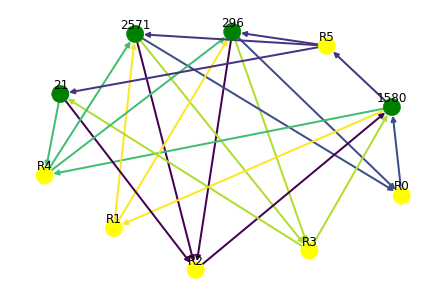

In [37]:
graph(movieId_21_rules, 6)

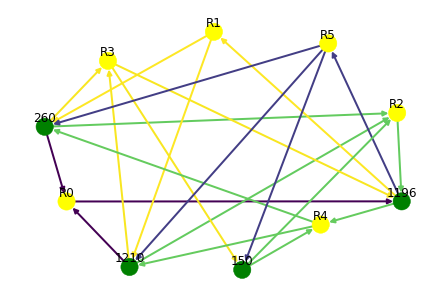

In [35]:
graph(movieId_150_rules, 6)